In [1]:
import os
import tempfile

import scanpy as sc
import scvi
from rich import print

/home/bnvlab2/miniconda3/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/bnvlab2/miniconda3/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/bnvlab2/miniconda3/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/home/bnvlab2/miniconda3/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/home/bnvlab2/miniconda3/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_mtx from `anndata` is deprecated. Import

In [2]:
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Seed set to 0


Last run with scvi-tools version: 1.3.1.post1

In [4]:
adata_atlas = sc.read("/home/bnvlab2/scVI_brain_organoids/no_erythocytes_atlas/annot_scANVI_5_allgenes.h5ad")

In [5]:
from scarches.models.scpoli import scPoli

2025-11-12 14:54:11.979611: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1762977251.990987 1855007 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1762977251.994143 1855007 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1762977252.003806 1855007 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1762977252.003819 1855007 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1762977252.003820 1855007 computation_placer.cc:177] computation placer alr

In [6]:
adata_atlas.obs['annot_detailed'] = adata_atlas.obs['annot_scANVI_leiden_30_3_256NB_5_res2_V2'].copy()

In [7]:
adata_atlas.obs['annot_detailed'].value_counts()

annot_detailed
Early Neurons            246627
Radial Glia              194104
Mature Neurons            95335
IPC                       28719
Astrocytes                15701
OPC                       11483
Radial Glia Prolif        11390
Neural crest              10036
Glial Progenitors          8536
Oligodendrocytes           7908
Mesenchyma                 7825
NC derived neurons         6302
Microglia                  4876
IPC Prolif                 3860
Ependymal                  2200
Choroid Plexus             2119
Spinal cord/Hindbrain       480
Endothelial cells           228
CR                          170
Immune                      160
Name: count, dtype: int64

In [8]:
rename_dict = {
    'Early Neurons': 'Early Neurons',
    'Radial Glia': 'Radial Glia',
    'Mature Neurons': 'Mature Neurons',
    'IPC': 'IPC',
    'Astrocytes': 'Astrocytes',
    'OPC': 'OPC',
    'Radial Glia Prolif': 'Progenitors Prolif',
    'Neural crest': 'Neural crest',
    'Glial Progenitors': 'Glial Progenitors',
    'Oligodendrocytes': 'Oligodendrocytes',
    'Mesenchyma': 'Mesenchyma',
    'NC derived neurons': 'NC derived neurons',
    'Microglia': 'Microglia',
    'IPC Prolif': 'Progenitors Prolif',
    'Ependymal': 'Ependymal',
    'Choroid Plexus': 'Choroid Plexus',
    'Spinal cord/Hindbrain': 'Radial Glia',
    'Endothelial cells': 'Mesenchyma',
    'CR': 'Mature Neurons',
    'Immune': 'Microglia'
}
adata_atlas.obs["annot_general"] = adata_atlas.obs["annot_detailed"].map(rename_dict)


In [9]:
adata_randall  = sc.read('/home/bnvlab2/Documents/Kate/Alzheimer/Randall_organoids/randall150_subset_ES_scores.h5ad')
adata_randall.layers['counts'] = adata_randall.raw.X.copy() 
adata_randall.raw = adata_randall
adata_randall.obs["adata_atlas"] = "Unknown"
adata_randall.obs["Batch"] = "query"
adata_randall.obs["age_upd"] = "Unknown"

In [10]:
genotype_mapping = {
    0: "ApoE3WT/PSEN1 E280A",
    1: "ApoE3Ch/PSEN1 E280A",
    2: "ApoE3WT/PSEN1WT",
    3: "ApoE3Ch/PSEN1WT"
}
adata_randall.obs["True_Condition2"] = adata_randall.obs["True_Condition"].map(genotype_mapping)
genotype_mapping1 = {
    "ApoE3WT/PSEN1 E280A" : 'PSEN1 E280A',
    "ApoE3Ch/PSEN1 E280A" :'PSEN1 E280A',
    "ApoE3WT/PSEN1WT" : 'PSEN1WT',
    "ApoE3Ch/PSEN1WT" : 'PSEN1WT'
}
adata_randall.obs["True_Condition_PSEN"] = adata_randall.obs["True_Condition2"].map(genotype_mapping1)

In [12]:
#genes_used = scpoli_model.adata.var_names
genes_used2 = adata_atlas.var_names
common_genes2 = set(genes_used2) & set(adata_randall.var_names)
len(common_genes2)

23183

In [13]:
sc.pp.filter_genes(adata_atlas, min_cells=3)
adata_atlas.shape

(658059, 67814)

In [14]:
sc.pp.filter_genes(adata_randall, min_cells=3)
adata_randall.shape

(89129, 34652)

In [15]:
#genes_used = scpoli_model.adata.var_names
genes_used2 = adata_atlas.var_names
common_genes2 = set(genes_used2) & set(adata_randall.var_names)
len(common_genes2)

22467

In [16]:
condition_key = 'Batch'
cell_type_key = ['adata_atlas'] #, 'age_upd' annot_leiden_scANVI2_res2_V2]

In [17]:
adata_ref_filtered = adata_atlas[:, list(common_genes2)].copy()
adata_query_filtered = adata_randall[:, list(common_genes2)].copy()

In [18]:
import numpy as np

In [19]:
np.max(adata_ref_filtered.X), np.max(adata_query_filtered.X)

(8.488254358610568, 8.297160127030825)

In [20]:
adata_ref_filtered.X = adata_ref_filtered.layers['counts']
adata_query_filtered.layers["counts"].data = np.rint(adata_query_filtered.layers["counts"].data).astype(int)
adata_query_filtered.X = adata_query_filtered.layers['counts']

In [21]:
scpoli_model_cell = scPoli(
    adata=adata_ref_filtered,
    condition_keys=condition_key,
    cell_type_keys=cell_type_key,
    embedding_dims=10,
    latent_dim = 20,
    recon_loss='nb',
     hidden_layer_sizes=[128] ##were 256
)

/home/bnvlab2/miniconda3/lib/python3.12/site-packages/scarches/models/scpoli/scpoli_model.py:151: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_metadata_ = adata.obs.groupby('conditions_combined').first()
/home/bnvlab2/miniconda3/lib/python3.12/site-packages/scarches/models/scpoli/scpoli_model.py:156: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_metadata_ = adata.obs.groupby(condition_keys).first()


Embedding dictionary:
 	Num conditions: [107]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 22467 128 10
	Mean/Var Layer in/out: 128 20
Decoder Architecture:
	First Layer in, out and cond:  20 128 10
	Output Layer in/out:  128 22467 



/home/bnvlab2/miniconda3/lib/python3.12/site-packages/scarches/models/scpoli/scpoli_model.py:164: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  adata.obs[cell_type_key][self.labeled_indices_]


In [22]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_prototype_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

In [23]:
import time

In [24]:

start_time = time.time()

scpoli_model_cell.train(
    n_epochs=30,
    pretraining_epochs=24,
    early_stopping_kwargs=early_stopping_kwargs,
    eta=5,
    unlabeled_prototype_training=False
)
end_time = time.time()
elapsed_time = end_time - start_time
elapsed_minutes = elapsed_time / 60
print(f"Benchmarking completed in {elapsed_minutes:.2f} minutes.")

INFO:scarches.trainers.scpoli.trainer:GPU available: True, GPU used: True


Initializing dataloaders
Starting training
 |████████████████████| 100.0%  - val_loss: 6264.75 - val_cvae_loss: 6241.54 - val_prototype_loss:   23.21 - val_labeled_loss:    4.64


Benchmarking completed in 49.29 minutes.

In [25]:
scpoli_query_cell = scPoli.load_query_data(
    adata=adata_query_filtered,
    reference_model=scpoli_model_cell,
    labeled_indices=[],
)

Embedding dictionary:
 	Num conditions: [108]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 22467 128 10
	Mean/Var Layer in/out: 128 20
Decoder Architecture:
	First Layer in, out and cond:  20 128 10
	Output Layer in/out:  128 22467 



In [26]:
start_time = time.time()

scpoli_query_cell.train(
    n_epochs=30,
    pretraining_epochs=24,
    eta=1,
    early_stopping_kwargs=early_stopping_kwargs
   # unlabeled_prototype_training=False
)

end_time = time.time()
elapsed_time = end_time - start_time
elapsed_minutes = elapsed_time / 60
print(f"Benchmarking completed in {elapsed_minutes:.2f} minutes.")

INFO:scarches.trainers.scpoli.trainer:GPU available: True, GPU used: True


The missing labels are: {'Unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'Unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'Unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'Unknown'}
Therefore integer value of those labels is set to -1
Initializing dataloaders
Starting training
 |████████████████----| 80.0%  - val_loss: 9255.65 - val_cvae_loss: 9255.65
Initializing unlabeled prototypes with Leiden with an unknown number of  clusters.


/home/bnvlab2/miniconda3/lib/python3.12/site-packages/scarches/trainers/scpoli/trainer.py:488: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(lat_adata, resolution=self.clustering_res)


Clustering succesful. Found 38 clusters.
 |████████████████████| 100.0%  - val_loss: 9261.42 - val_cvae_loss: 9261.42 - val_prototype_loss:    0.00 - val_unlabeled_loss:    0.43


Benchmarking completed in 7.40 minutes.

In [239]:
model_dir = "/home/bnvlab2/scVI_brain/no_erythocytes/models/scpoli_query_4_7_V2"
os.makedirs(model_dir, exist_ok=True)

scpoli_query_cell.save(model_dir, overwrite=True)

model_dir = "/home/bnvlab2/scVI_brain/no_erythocytes/models/scpoli_model_4_7_V2"
os.makedirs(model_dir, exist_ok=True)

scpoli_model_cell.save(model_dir, overwrite=True)


In [27]:
import gc
gc.collect()

0

In [28]:
adata_query_filtered.X = adata_query_filtered.X.astype("float32")

In [29]:
import torch
torch.cuda.empty_cache()

In [31]:
import os
os.getpid()

3087012

In [32]:
results_dict = scpoli_query_cell.classify(adata_query_filtered, scale_uncertainties=True)

In [ ]:
results_dict

In [33]:
import seaborn as sns

<Axes: ylabel='Count'>

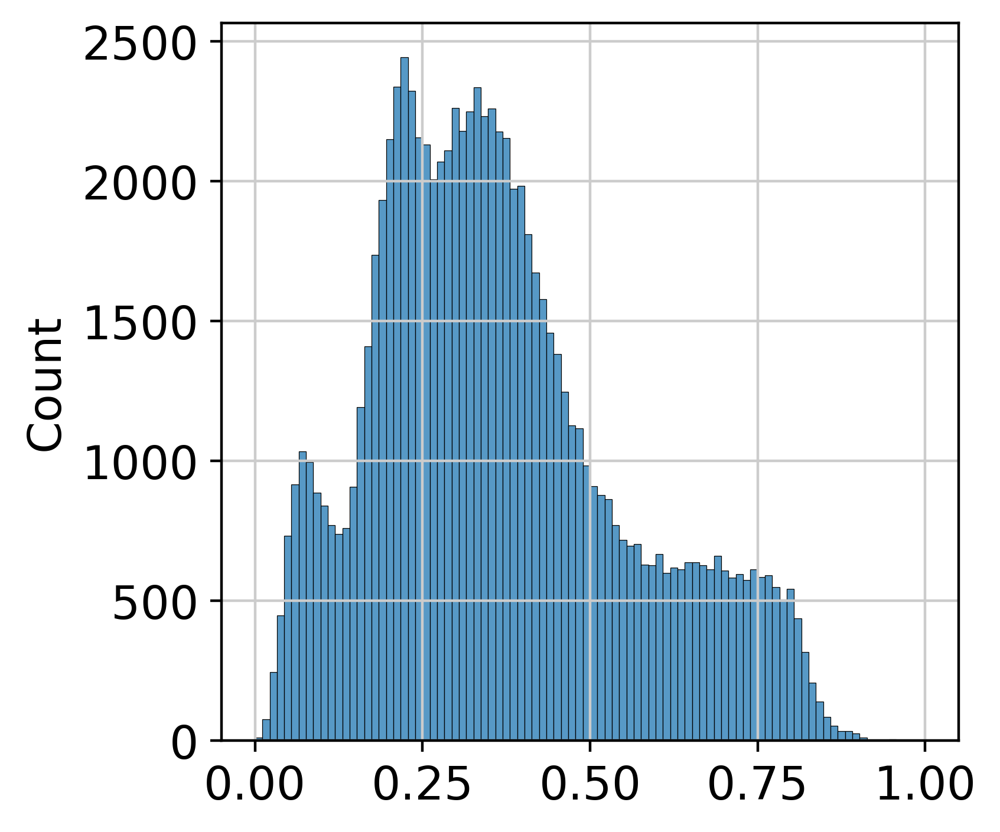

In [34]:
sns.histplot(results_dict['adata_atlas']['uncert'])

In [240]:
sc.pp.neighbors(adata_latent_full, n_neighbors=15)

In [241]:
sc.tl.umap(adata_latent_full)

<Axes: title={'center': 'cell_type_pred'}, xlabel='UMAP1', ylabel='UMAP2'>

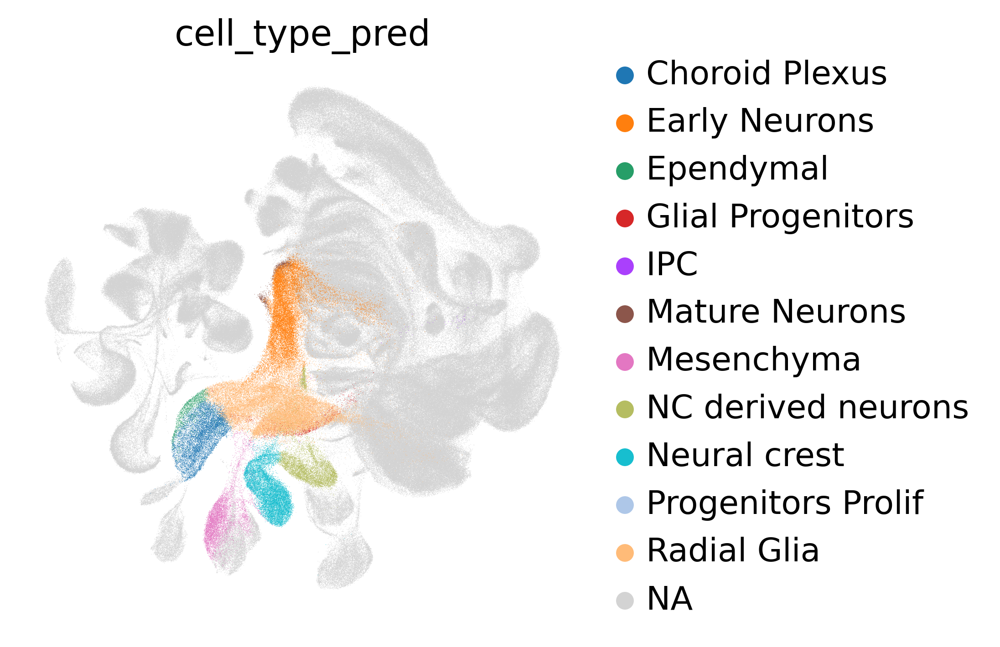

In [243]:
sc.pl.umap(
    adata_no_prototypes,
    color=['cell_type_pred'],
    show=False,
    frameon=False,
    cmap='magma',
    vmax=1
)

In [250]:
adata_no_prototypes

AnnData object with n_obs × n_vars = 747188 × 20
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Age', 'CellClass', 'CellCyclePhase', 'Region', 'Subregion', 'organism_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'assay_ontology_term_id', 'sex_ontology_term_id', 'development_stage_ontology_term_id', 'donor_id', 'suspension_type', 'tissue_type', 'dissection', 'tissue_ontology_term_id', 'cell_type_ontology_term_id', 'fraction_mitochondrial', 'fraction_unspliced', 'cell_cycle_score', 'total_genes', 'total_UMIs', 'sample_id', 'cluster_id', 'is_primary_data', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'percent.rb', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.1', 'seurat_clusters', 'GSM', 'GSE', 'batch_n', 'age', 'region', 'cell_cluster', 'CytoTRACE2_Score', 'CytoTRACE2_Potency', 'CytoTRACE2_Relative', 'preKNN_CytoTRACE2_Score', 'preKNN_C

<Axes: title={'center': 'annot_scANVI_leiden_30_3_256NB_5_res2_V2_general'}, xlabel='UMAP1', ylabel='UMAP2'>

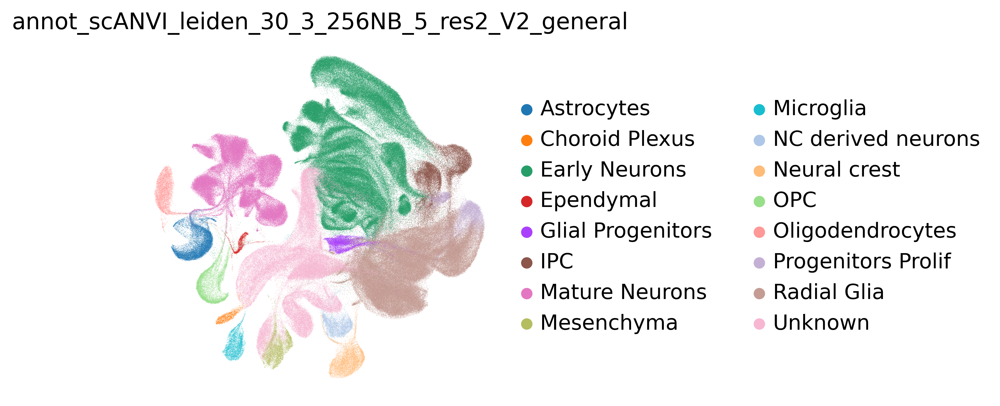

In [253]:
sc.pl.umap(
    adata_no_prototypes,
    color='adata_atlas',
    show=False,
    frameon=False,
)

In [265]:
adata_query_filtered.obsm['X_scpoli'] = scpoli_query_cell.get_latent(adata_query_filtered, mean=True)

In [266]:
sc.pp.neighbors(adata_query_filtered, use_rep='X_scpoli')

In [267]:
sc.tl.umap(adata_query_filtered)

In [268]:
sc.tl.leiden(adata_query_filtered, resolution = 1, key_added = 'leiden_scpoli_1')

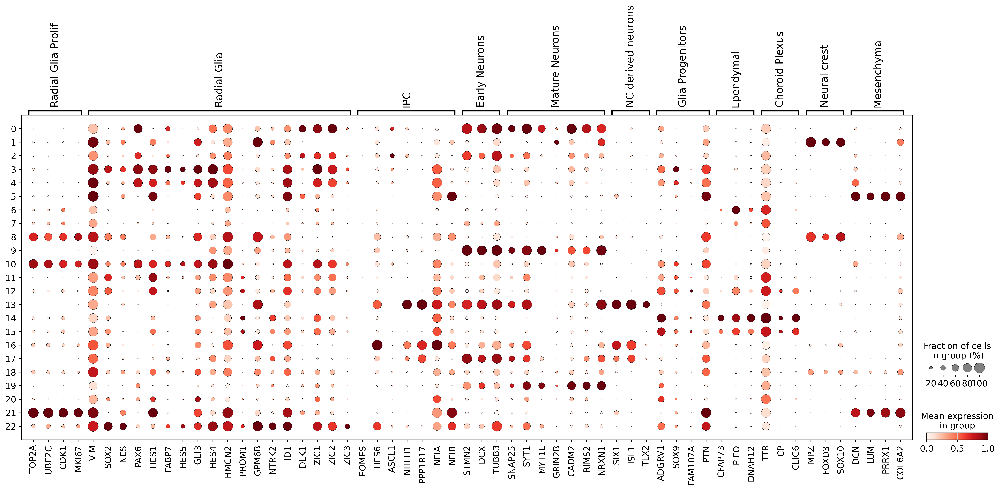

In [269]:
sc.pl.dotplot(
    adata_query_filtered,
    var_names=gene_markers8, #NC_neuron,
   # expression_cutoff=1.5,
    groupby='leiden_scpoli_1',  # or 'leiden', etc.
    use_raw=True,         # or False if you're working with normalized data
    standard_scale='var', # normalize gene-wise (optional)
   #save='randall_subset2_7_less_epoch_dotplot.png',
  # dendrogram=True       # optional clustering of groups
)

In [271]:
adata_query_filtered

AnnData object with n_obs × n_vars = 89129 × 22467
    obs: 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'percent.rb', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.1', 'seurat_clusters', 'pANN_0.25_0.19_1101', 'DF.classifications_0.25_0.19_1101', 'DF.classifications_0.25_0.19_1030', 'origin', 'condition', 'pANN_0.25_0.13_641', 'DF.classifications_0.25_0.13_641', 'DF.classifications_0.25_0.13_604', 'pANN_0.25_0.005_481', 'DF.classifications_0.25_0.005_481', 'DF.classifications_0.25_0.005_448', 'pANN_0.25_0.28_307', 'DF.classifications_0.25_0.28_307', 'DF.classifications_0.25_0.28_285', 'pANN_0.25_0.16_753', 'DF.classifications_0.25_0.16_753', 'DF.classifications_0.25_0.16_704', 'pANN_0.25_0.19_640', 'DF.classifications_0.25_0.19_640', 'DF.classifications_0.25_0.19_600', 'pANN_0.25_0.08_728', 'DF.classifications_0.25_0.08_728', 'DF.classifications_0.25_0.08_682', 'pANN_0.25_0.15_532', 'DF.classifications_0.25_0.15_532', 'DF.classifications_0.25_0.15_494', 'integrated_snn_re

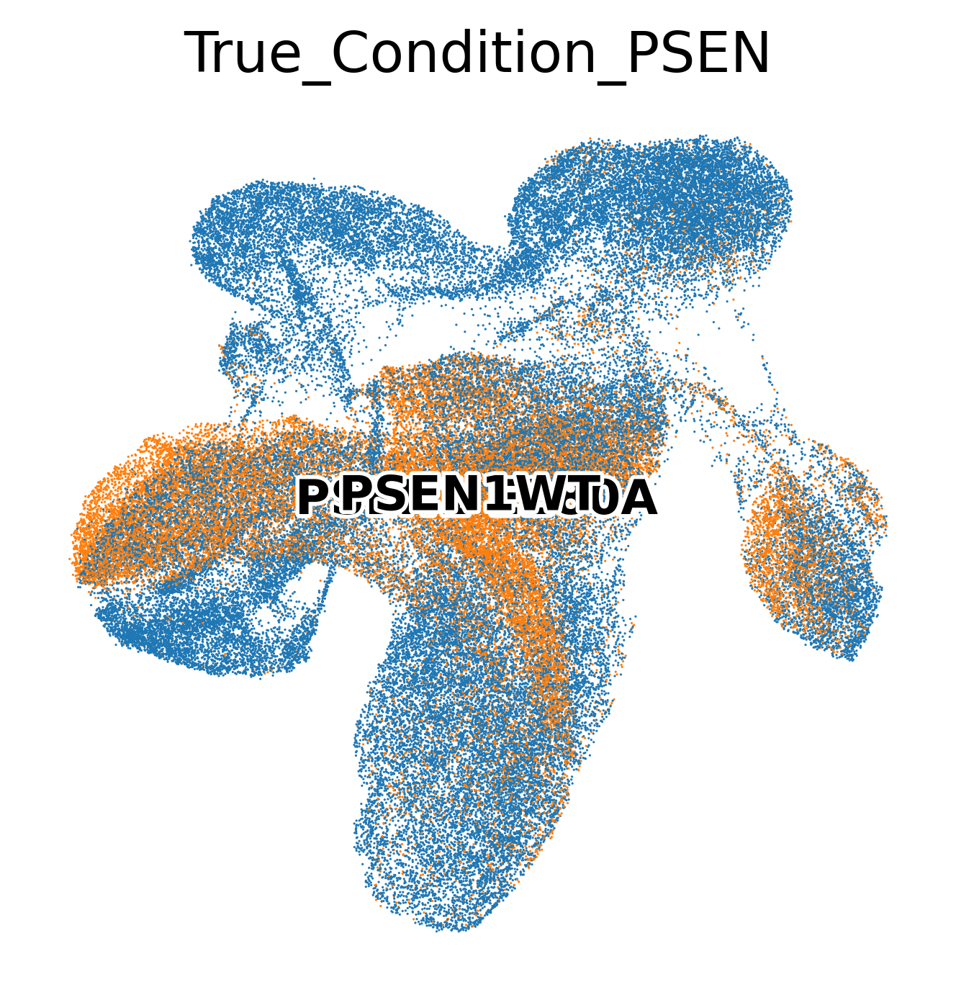

In [272]:
sc.pl.umap(adata_query_filtered, color = ['True_Condition_PSEN'],
                add_outline=False, legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, frameon=False)

In [37]:
#get latent representation of reference data
scpoli_model_cell.model.eval()
data_latent_source = scpoli_model_cell.get_latent(
    adata_ref_filtered,
    mean=True
)

adata_latent_source = sc.AnnData(data_latent_source)
adata_latent_source.obs = adata_ref_filtered.obs.copy()

In [38]:
#get latent representation of query data
data_latent= scpoli_query_cell.get_latent(
    adata_query_filtered,
    mean=True
)
adata_latent = sc.AnnData(data_latent)
adata_latent.obs = adata_query_filtered.obs.copy()

In [39]:
#get label annotations
adata_latent.obs['cell_type_pred'] = results_dict['adata_atlas']['preds'].tolist()
adata_latent.obs['cell_type_uncert'] = results_dict['adata_atlas']['uncert'].tolist()

In [40]:

#get prototypes
labeled_prototypes = scpoli_query_cell.get_prototypes_info()
labeled_prototypes.obs['Batch'] = 'labeled prototype'
unlabeled_prototypes = scpoli_query_cell.get_prototypes_info(prototype_set='unlabeled')
unlabeled_prototypes.obs['Batch'] = 'unlabeled prototype'


In [41]:
unlabeled_prototypes.obs

,batch,annot_scANVI_leiden_30_3_256NB_5_res2_V2_general,annot_scANVI_leiden_30_3_256NB_5_res2_V2_general_pred,annot_scANVI_leiden_30_3_256NB_5_res2_V2_general_uncert,Batch
0,prototype-Set Unlabeled,0,Neural crest,0.907003,unlabeled prototype
1,prototype-Set Unlabeled,1,Early Neurons,0.536698,unlabeled prototype
2,prototype-Set Unlabeled,2,Radial Glia,1.171837,unlabeled prototype
3,prototype-Set Unlabeled,3,Early Neurons,0.542923,unlabeled prototype
4,prototype-Set Unlabeled,4,Radial Glia,1.821027,unlabeled prototype
5,prototype-Set Unlabeled,5,Radial Glia,1.050710,unlabeled prototype
6,prototype-Set Unlabeled,6,Neural crest,0.719680,unlabeled prototype
7,prototype-Set Unlabeled,7,Early Neurons,0.842573,unlabeled prototype
8,prototype-Set Unlabeled,8,Mesenchyma,0.171947,unlabeled prototype
9,prototype-Set Unlabeled,9,Radial Glia,0.830085,unlabeled prototype


In [42]:
import numpy as np

In [43]:
#join adatas
adata_latent_full = adata_latent_source.concatenate(
    [adata_latent, labeled_prototypes, unlabeled_prototypes],
    batch_key='query'
)

/tmp/ipykernel_3087012/3147683035.py:2: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_latent_full = adata_latent_source.concatenate(


In [44]:
adata_latent_full.obs['cell_type_pred'][adata_latent_full.obs['query'].isin(['0'])] = np.nan

/tmp/ipykernel_3087012/115620281.py:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata_latent_full.obs['cell_type_pred'][adata_latent_full.obs['query'].isin(['0'])] = np.nan
/tmp/ipykernel_3087012/115620281.py:1: SettingWithCopyWarning: 

In [45]:
adata_no_prototypes = adata_latent_full[adata_latent_full.obs['query'].isin(['0', '1'])]

In [46]:
gc.collect()

161

In [47]:
# Step 1: Extract the relevant metadata
metadata = adata_no_prototypes.obs[['cell_type_pred', 'cell_type_uncert']]
#metadata.columns = ['cell_type_pred4', 'cell_type_uncert4']
import re

# Apply to the index of the metadata DataFrame
metadata.index = metadata.index.to_series().str.replace(r'-\d+$', '', regex=True)
# Step 2: Keep only cells that are also in adata_target
common_cells = adata_randall.obs_names.intersection(metadata.index)
metadata_common = metadata.loc[common_cells]

# Step 3: Add the metadata to adata_target.obs (for overlapping cells only)
adata_randall.obs = adata_randall.obs.join(metadata_common, how="left")

In [48]:
adata_randall_subset2 = adata_randall[adata_randall.obs['cell_type_uncert'] < 0.75]

In [50]:
adata_randall_subset2.shape

(85001, 34652)

In [51]:
adata_randall.shape

(89129, 34652)

<Axes: title={'center': 'cell_type_uncert'}, xlabel='UMAP1', ylabel='UMAP2'>

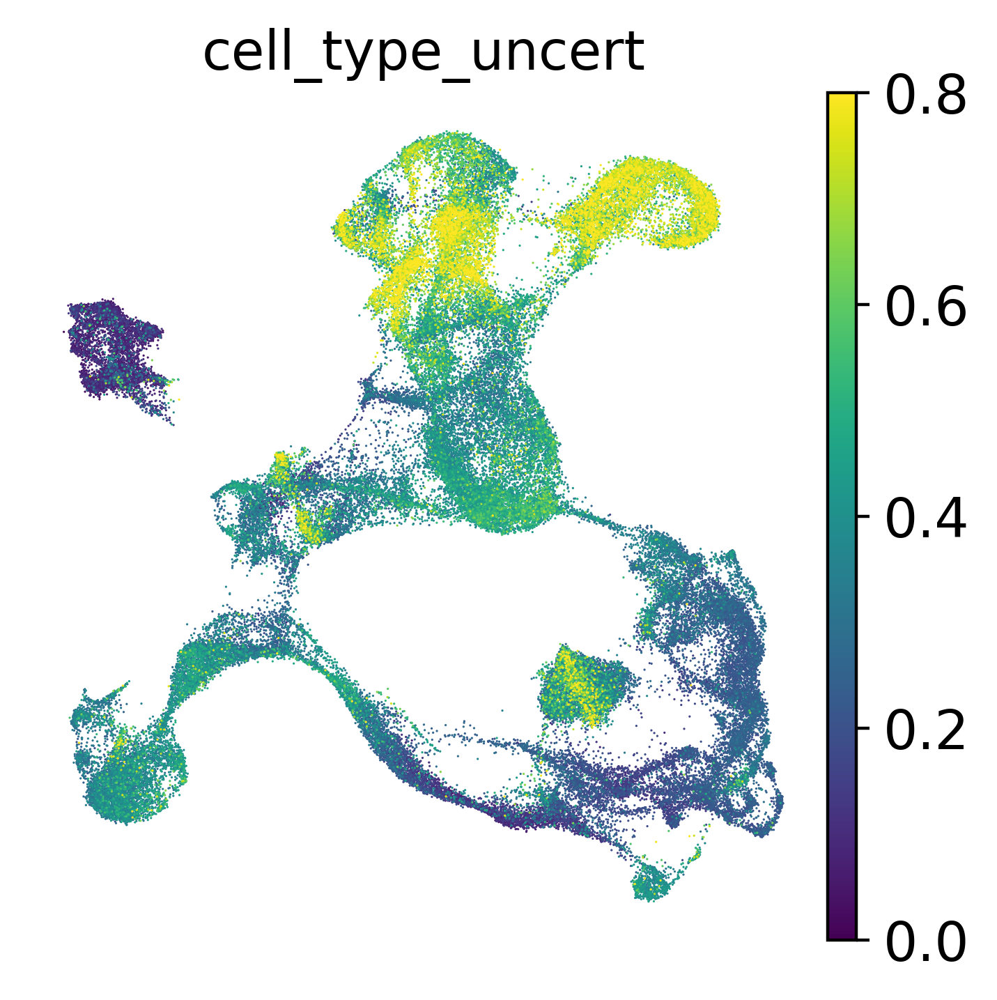

In [52]:

sc.pl.umap(
    adata_randall,
    color='cell_type_uncert',
    show=False,
    frameon=False, vmax=0.8  # legend_loc='right margin', #legend_loc= 'on data', 
  #  legend_fontsize=6 ,  
)

<Axes: title={'center': 'cell_type_pred'}, xlabel='UMAP1', ylabel='UMAP2'>

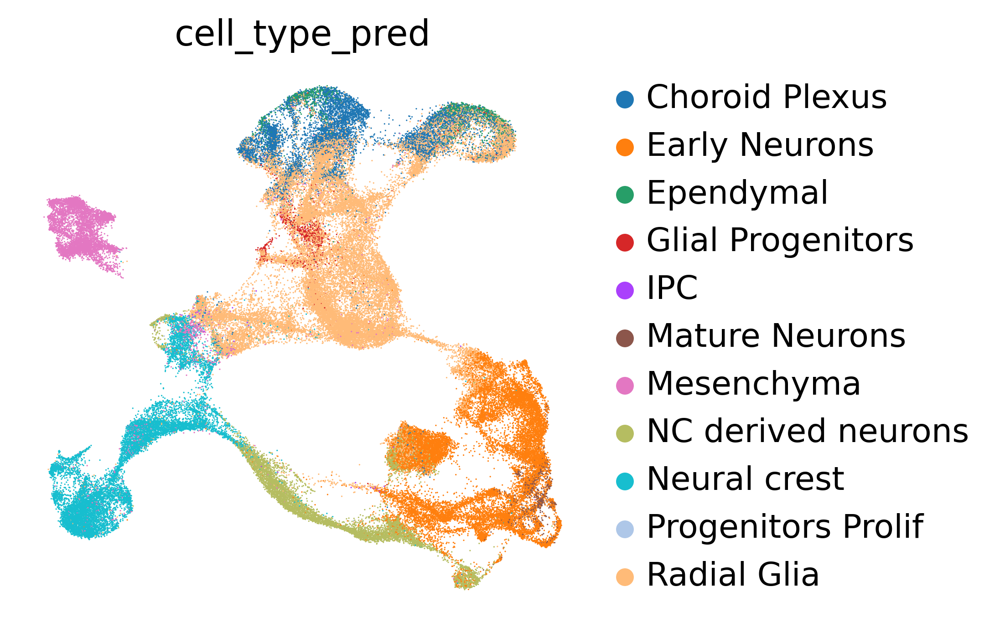

In [55]:
sc.pl.umap(
    adata_randall,
    color='cell_type_pred',
    show=False,
    frameon=False,# vmax=0.8  # legend_loc='right margin', #legend_loc= 'on data', 
  #  legend_fontsize=6 ,  
)

In [56]:
def cluster_small_multiples_umap(
    adata, clust_key, size=60, frameon=False, legend_loc=None, **kwargs
):
    tmp = adata.copy()
    for i, clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype("category")
        tmp.uns[clust + "_colors"] = ["#D3D3D3", adata.uns[clust_key + "_colors"][i]]
    sc.pl.umap(
        tmp,
        groups=tmp.obs[clust].cat.categories[1:].values,
        color=adata.obs[clust_key].cat.categories.tolist(),
        size=size,
        frameon=frameon,
        legend_loc=legend_loc,
        **kwargs,
    )


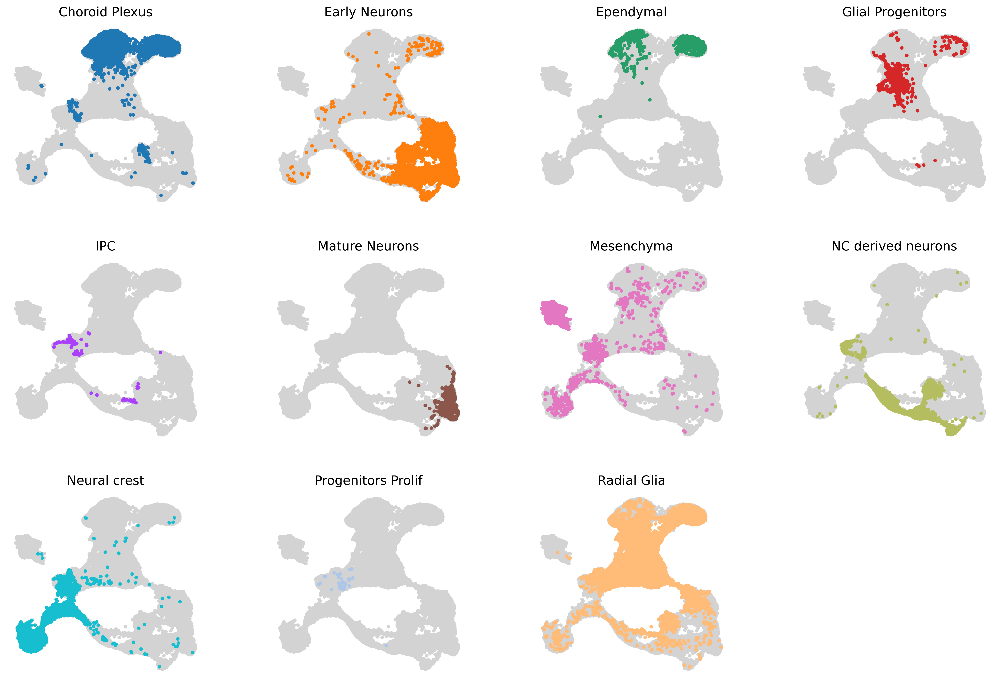

In [57]:
cluster_small_multiples_umap(adata_randall, 'cell_type_pred')

In [61]:
adata_randall.obs['cell_type_pred'].value_counts()

cell_type_pred
Radial Glia           30798
Early Neurons         19576
Neural crest          12143
Choroid Plexus         8867
NC derived neurons     7307
Mesenchyma             6663
Ependymal              1755
Glial Progenitors       996
Mature Neurons          877
IPC                      96
Progenitors Prolif       51
Name: count, dtype: int64

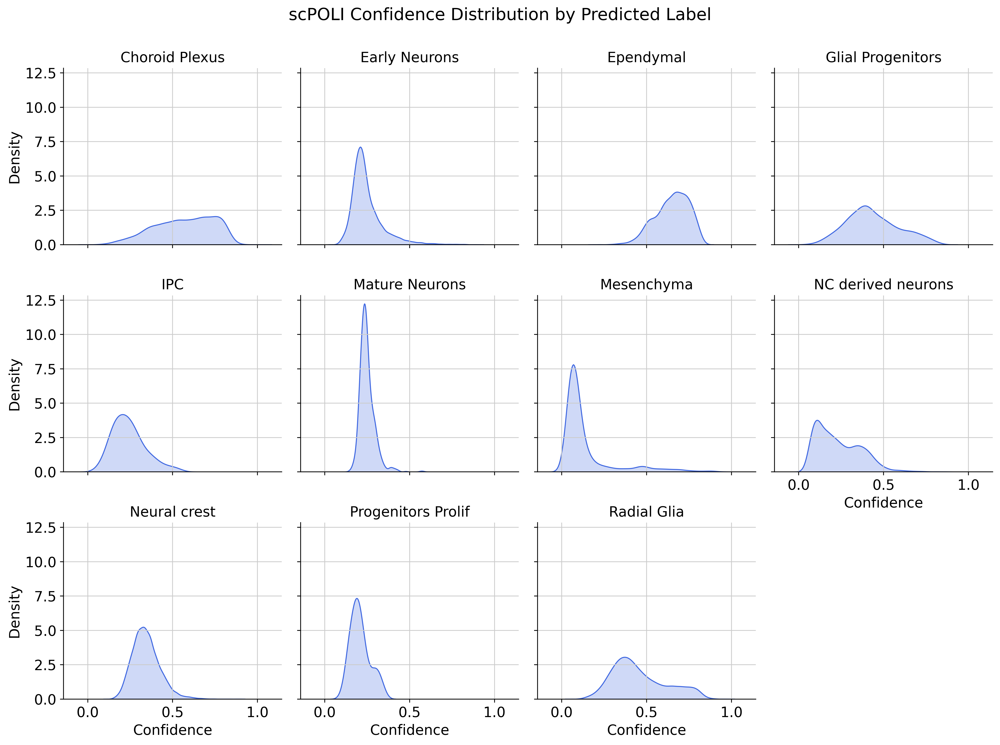

In [62]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter: only cells with valid predictions and confidence
df = adata_randall.obs[["cell_type_pred", "cell_type_uncert"]].dropna()

# Set up FacetGrid
g = sns.FacetGrid(df, col="cell_type_pred", col_wrap=4, sharex=True, sharey=True, height=3.5)

# Map the density plot
g.map(sns.kdeplot, "cell_type_uncert", fill=True, color="royalblue")
#for ax in g.axes.flatten():
   # ax.set_xlim(0, 1)
# Aesthetics
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Confidence", "Density")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("scPOLI Confidence Distribution by Predicted Label")

plt.show()

In [63]:
gene_markers8 = {
    "Radial Glia Prolif": ["TOP2A", "UBE2C", "CDK1", "MKI67"],
    "Radial Glia": ["VIM", "SOX2", "NES", "PAX6"],
    "IPC": ["EOMES", "HES6", "ASCL1", "NHLH1", "PPP1R17"],
    "Early Neurons": ["STMN2", "DCX", "TUBB3"],
    "Mature Neurons": ["SNAP25", "SYT1", "MYT1L", "GRIN2B", "CADM2", "RIMS2", "NRXN1"],
    "NC derived neurons": ["SIX1", "ISL1", "TLX2"],
    "Glia Progenitors": ["ADGRV1", "SOX9", "FAM107A", "PTN"],
    "Ependymal": ["CFAP73", "PIFO", "DNAH12"],
    "Choroid Plexus": ["TTR", "CP", "CLIC6"],
    "Neural crest": ["MPZ", "FOXD3", "SOX10"],
    "Mesenchyma": ["DCN", "LUM", "PRRX1", "COL6A2"],
}

In [65]:
cell_type_order = [

    'Progenitors Prolif',
    'Radial Glia',
    'IPC',
  
    'Early Neurons',
    'Mature Neurons',
  
    'NC derived neurons',
    'Glial Progenitors',

    'Ependymal',
    'Choroid Plexus',

    'Neural crest',
    'Mesenchyma',
  
]

adata_randall.obs['cell_type_pred'] = pd.Categorical(
    adata_randall.obs['cell_type_pred'],
    categories=cell_type_order,
    ordered=True
)


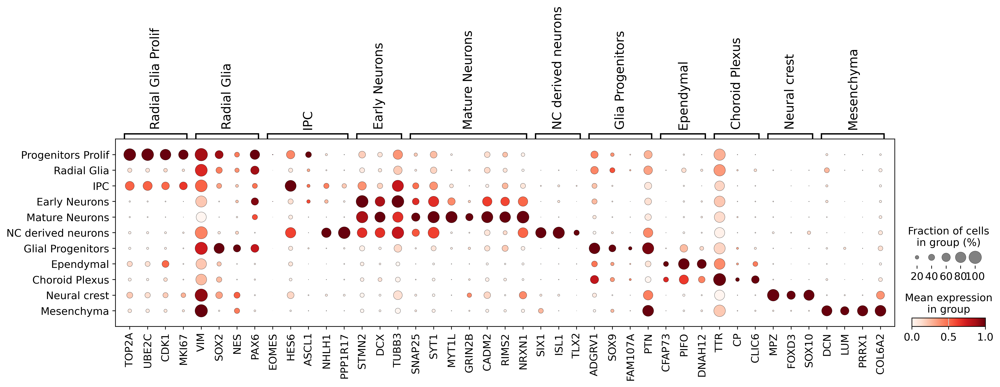

In [118]:
sc.pl.dotplot(
    adata_randall,
    var_names=gene_markers8,
    groupby='cell_type_pred',
    use_raw=True,         
    standard_scale='var', 
   save='randall_7_V2otplot.png',
)

In [121]:
# meta_randal = adata_randall.obs[['cell_type_pred', 'cell_type_uncert']]
# meta_randal.to_csv("meta_randall4_7_V2.csv")